# Example implementation of t-SNE

### Useful links to learn about t-SNE:

https://www.youtube.com/watch?v=RJVL80Gg3lA&list=UUtXKDgv1AVoG88PLl8nGXmw

https://lvdmaaten.github.io/tsne/

https://distill.pub/2016/misread-tsne/##

### Starter advice for working with t-SNE:

Basics: t-SNE seeks to represent the distances of points in high dimensional parameter space in (usually) two dimensional parameter space. Where PCA is linear and mathematical, t-SNE is nonlinear and probabalistic. It has a non-convex loss function, so every training is unique. t-SNE can be used to visualize data, and to help understand what underlying attributes the selected features capture.

Assessing quality: The only undisputed advice for this is to just look at the plots. If the points aren't resolving into clear groups, this could be a user error or this could reflect a lack of structure in the data. If the groupings are elongated, this is a sign that the embedding hasn't run for enough iterations. You can run the t-SNE multiple times with the exact same data and hyperparameters, and select the version with the lowest KL divergence.

Hyperparameter fine tuning: There are conflicting claims on t-SNE's robustness to hyperparameter selection. It likely depends greatly on the dataset. Perplexity, which roughly describes how many effective nearest neigbors a given point has, is one important value to look at. It is advised to be set between 5 and 50, but should be larger for larger and denser datasets. Learning rate and exaggeration are other hyperparameters to experiment with.

Interpreting the plot: The size of clusters and the distance of clusters from each other should not be considered meaningful. Noise can appear to have a pattern in the plot in certain data+hyperparameter combinations.

# do tSNE

In [6]:
from tsne_utils import alert_preprocessor, prep_TSNE, tSNE

In [7]:
# Load alerts (~1000 public and filter alerts from 03-19-24)
example_path = '../example_data/240319_public_filtered.parquet'
preprocessor = alert_preprocessor(path=example_path, drb_cut=0.4, filtered_only=False, custom_columns=[], remove_instrumental=True, )
df = preprocessor.preprocess_data()

In [9]:
# prep for tsne, ie do PCA
prep = prep_TSNE(df, use_PCA=False, pca_ncomp=40)
data = prep.prep_data()

In [12]:
# Perform t-SNE

tsne = tSNE(data, perplexity=60, max_iter=3000, method='barnes_hut', n_jobs=8, save_path='default')
tsne_results = tsne.get_tsne()

# optionally get additional labels and classifications for data

In [3]:
# load df
import pandas as pd
df_add_classification = pd.read_parquet(example_path)

In [11]:
from alert_classifications import FritzNightClassifications

In [ ]:
# get fritz classifications from the same night
fritznight_data, df_add_classification = FritzNightClassifications(df_add_classification, add_to_df=True).get_classifications()

In [ ]:
from alert_classifications import SimbadClassifications

In [ ]:
# simbad classifications (will only look at filtered alerts to save time)
savepath = './simbad_filtered.pkl'
simbad_data, df_add_classification = SimbadClassifications(df_add_classification, savepath, add_to_df=True, filtered_only=True).get_classifications()

In [229]:
from alert_classifications import CatalogClassifications

In [21]:
# catnorth catalog crossmatch
catnorth_data, df_add_classification = CatalogClassifications(df_add_classification, 'CatNorth', {"z_xp_nn": 1}, 'gloria', add_to_df=True).get_classifications()

In [83]:
# gaia
gaia_data, df_add_classification = CatalogClassifications(df_add_classification, 'Gaia_DR2', {"source_id": 1}, 'kowalski', , add_to_df=True).get_classifications()    

In [ ]:
from alert_classifications import FritzClassifications

In [ ]:
# crossmatching with objects in the ~20k object catalog with fritz classifications
fritz_data, df_add_classification = FritzClassifications(df_add_classification, add_to_df=True).get_classifications()

In [ ]:
from alert_classifications import AcaiClassifications

In [ ]:
# check if the alert has a dominant acai score
acai_data, df_add_classification = AcaiClassifications(df_add_classification, add_to_df=True).get_classifications()

In [ ]:
from alert_classifications import FilterClassifications

In [ ]:
# assign a classification based on what the filter passed should be looking for

filter_data, df_add_classification = FilterClassifications(df_add_classification, add_to_df=True).get_classifications()

In [150]:
# save this df with classifications
df_filepath = '../example_data/240319_with_classifications.parquet'
df_add_classification.to_parquet(df_filepath)

# inspect t-SNE

In [16]:
# open saved df and also tsne results (these files are private)

import pickle
import pandas as pd

tsne_path =  "../../../frigate_private/stats_analysis/tsne_trained/tsne17.pkl"
with open(tsne_path, 'rb') as f:
    tsne_results = pickle.load(f)   

# load df with classifications, can replace with the initial df
df_filepath = '../private_data/240319_with_classifications.parquet'
df_plot = pd.read_parquet(df_filepath)

df_plot = df_plot[df_plot['drb'] > 0.4]
df_plot['tsne-2d-one'] = tsne_results[:,0]
df_plot['tsne-2d-two'] = tsne_results[:,1]

In [22]:
# alternatively, open a df with tsne results already saved to columns ie the provided example

import pandas as pd

df_plot = pd.read_parquet('../example_data/240319_public_filtered_with_tsne.parquet')

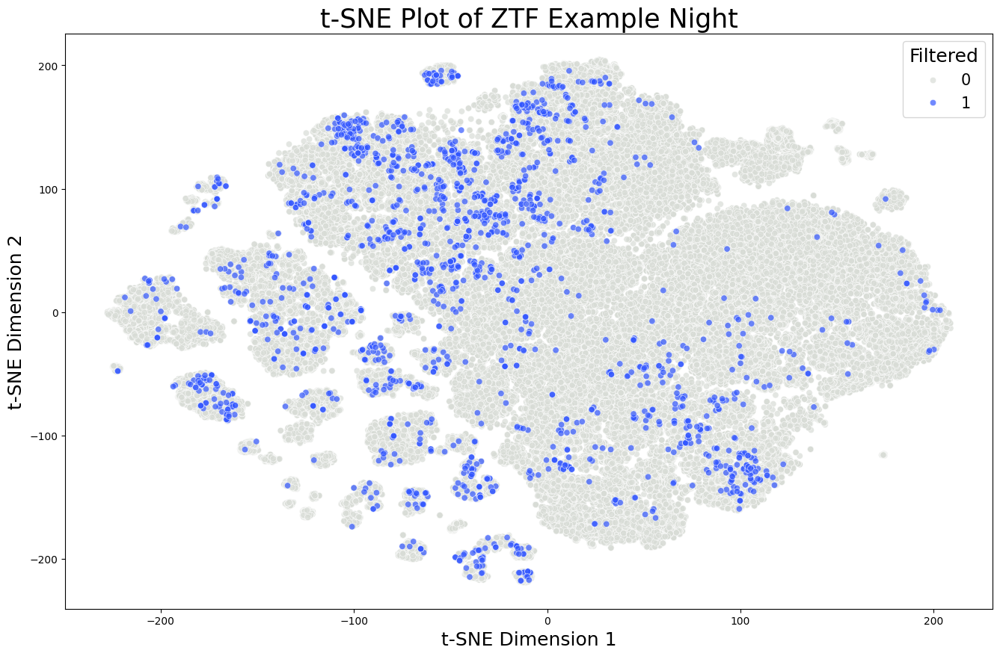

In [2]:
# color based on whether the alert was filtered
from plot_tsne import TsnePlotter
plotter = TsnePlotter(df_plot)
plotter.plot_filtered()

In [13]:
from plot_tsne import TsnePlotter_featurecolor
plotter = TsnePlotter_featurecolor(df_plot)

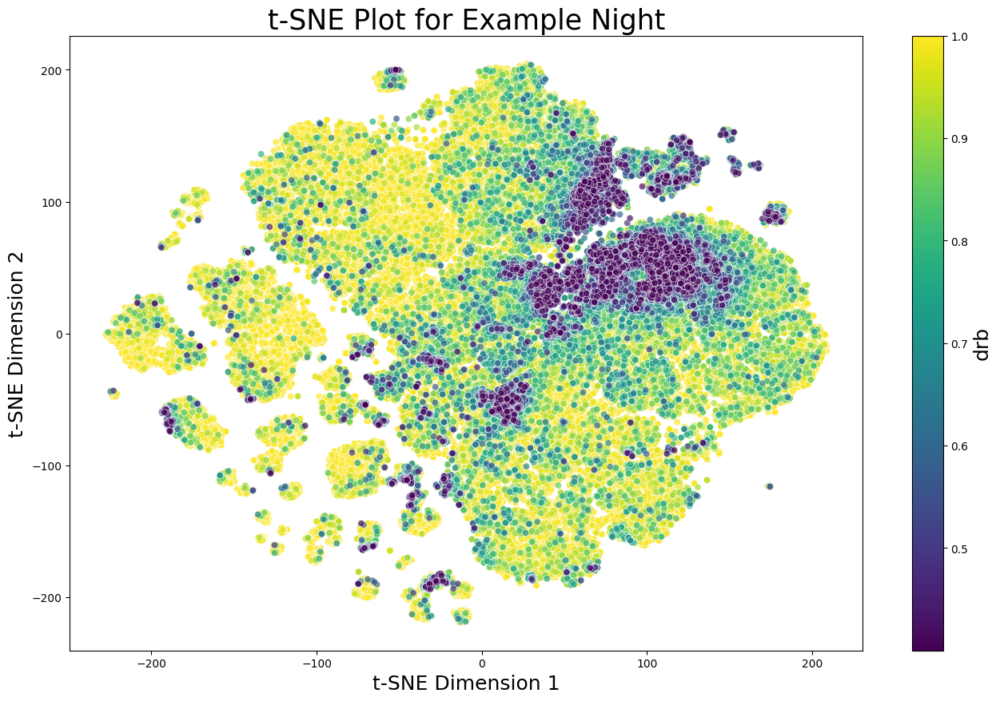

In [3]:
# color based on custom input feature (any column in df)
from plot_tsne import TsnePlotter_featurecolor
plotter = TsnePlotter_featurecolor(df_plot)
plotter.plot_parameter_analysis('drb', reorder=True, ascending=False, remove_error_values=True, use_colorbar=True)

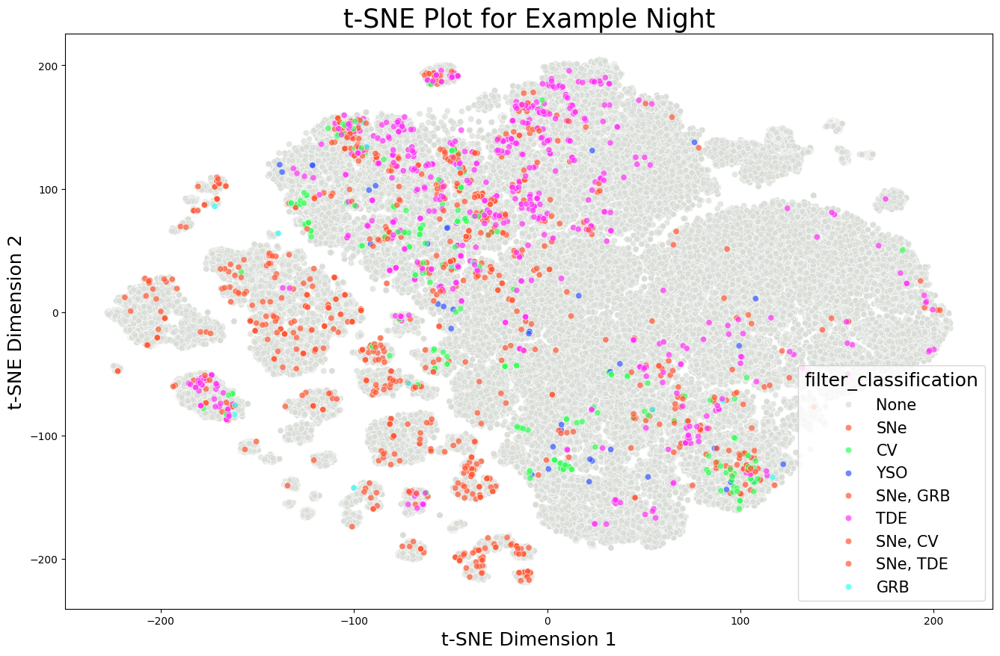

In [14]:
# plot coloring on what the filter passed should be looking for

plotter.plot_parameter_analysis('filter_classification', reorder=True, ascending=False, remove_error_values=False, use_colorbar=False)

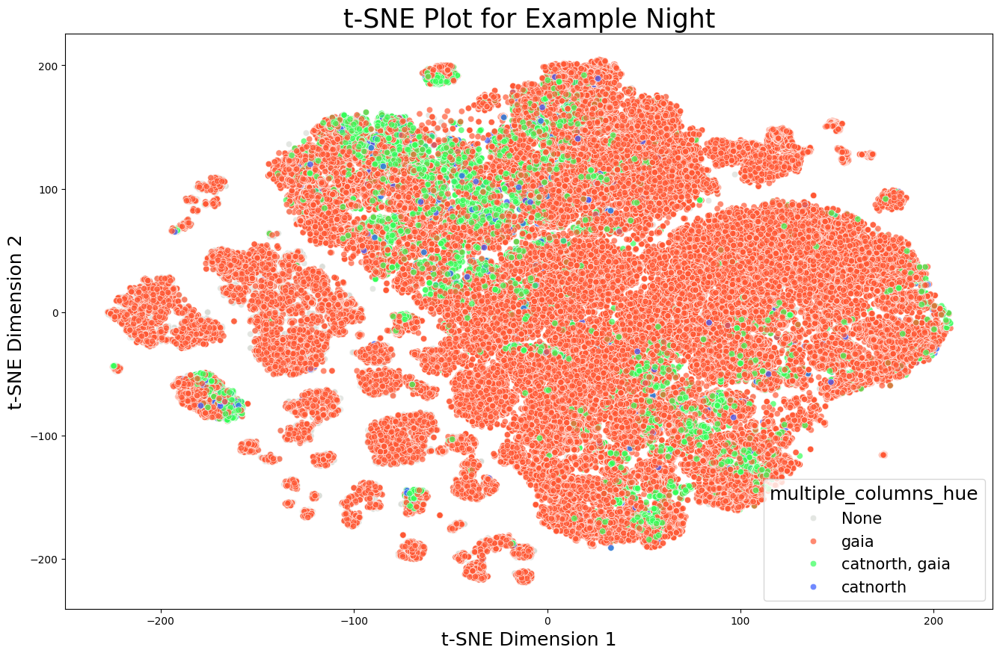

In [15]:
# we can give a list of multiple columns for the hue, ie if we have multiple catalog crossmatches we want to inspect on one plot

plotter.plot_parameter_analysis(['catnorth_classification', 'gaia_classification'],
                                reorder=True, 
                                ascending=False, 
                                remove_error_values=False, 
                                use_colorbar=False)

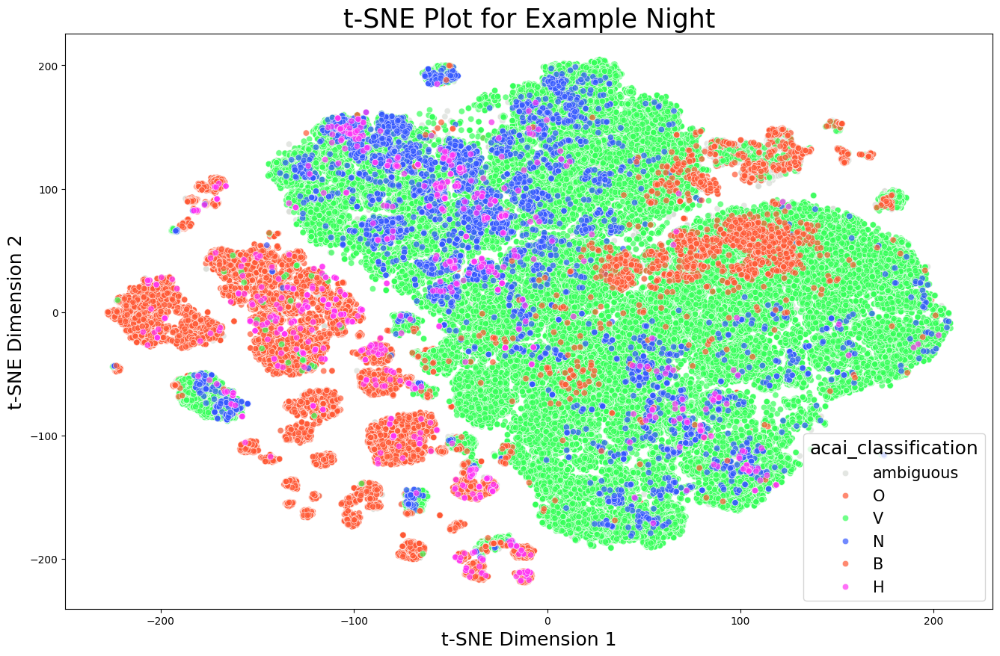

In [55]:
# we can give a custom order to plot the hue values in, ie for acai scores (values at end of list plotted on top)

plotter.plot_parameter_analysis('acai_classification',
                                reorder=['ambiguous', 'O', 'V', 'N', 'B', 'H'], 
                                ascending=False, 
                                remove_error_values=False, 
                                use_colorbar=False)

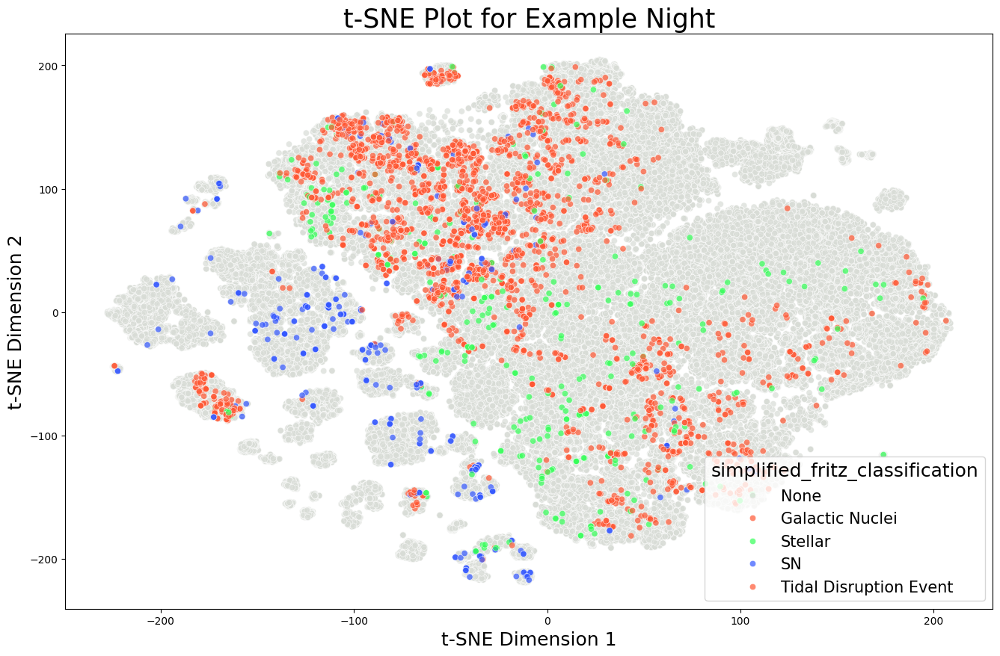

In [48]:
# color based on Fritz classifications (from the ~20k object catalog). use simplify_fritz to show some broader categories

plotter.plot_parameter_analysis('fritz_catalog_classification', reorder=True, ascending=False, remove_error_values=False, use_colorbar=False, simplify_fritz=True)

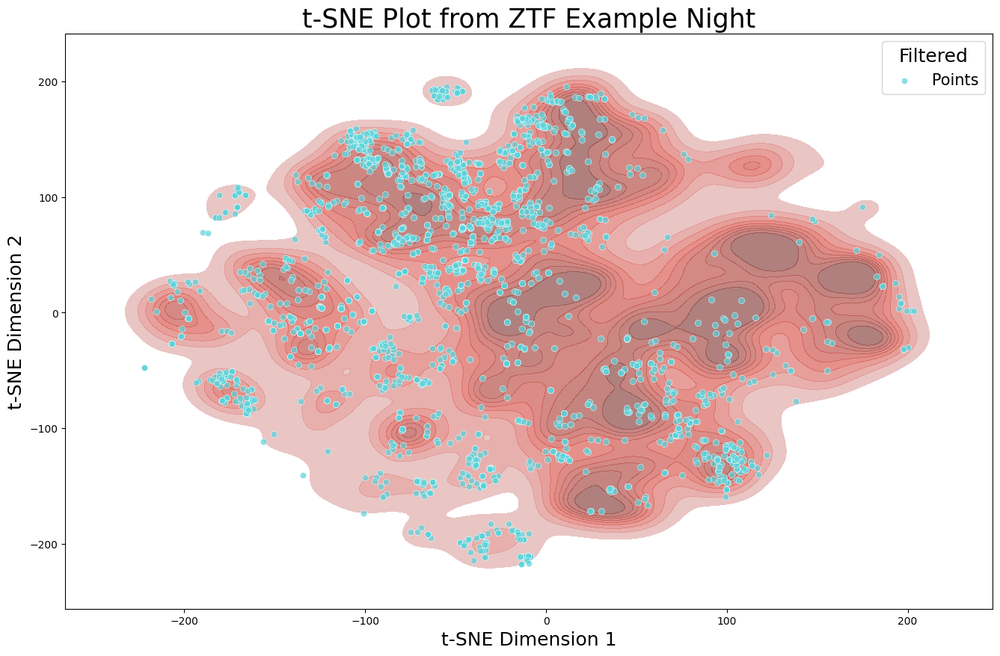

In [22]:
# plot unfiltered as density (this is slow)
from plot_tsne import TsnePlotter_density
plotter = TsnePlotter_density(df_plot)
plotter.plot_filtered_density()

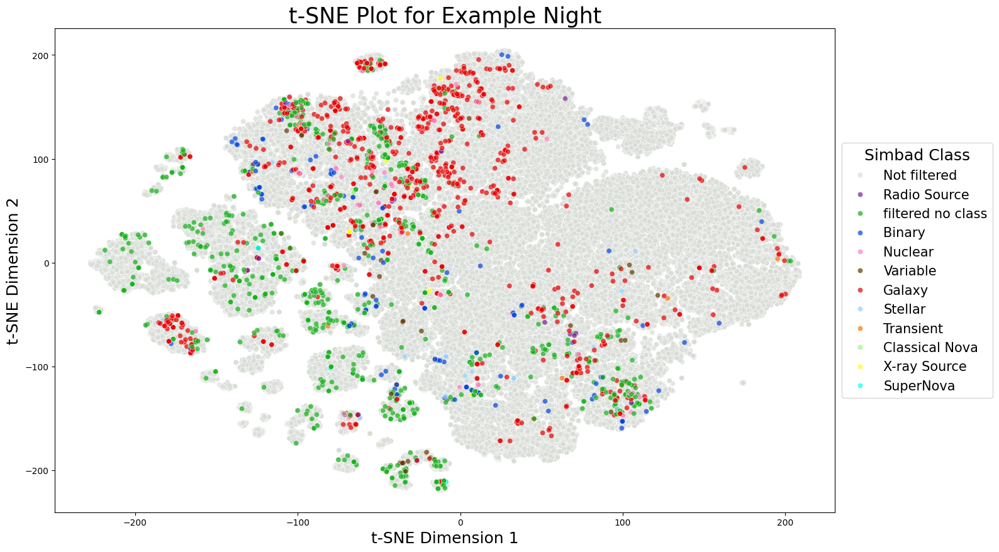

In [27]:
# color based on simbad classifications
# to use all simbad classifications, use mapping_dict=False, or make a custom mapping dictionary
from plot_tsne import TsnePlotter_simbad
plotter = TsnePlotter_simbad(df_plot)
plotter.plot_simbad_analysis('simbad_classification', reorder=True, mapping_dict='Default')

# Rudimentary point selection

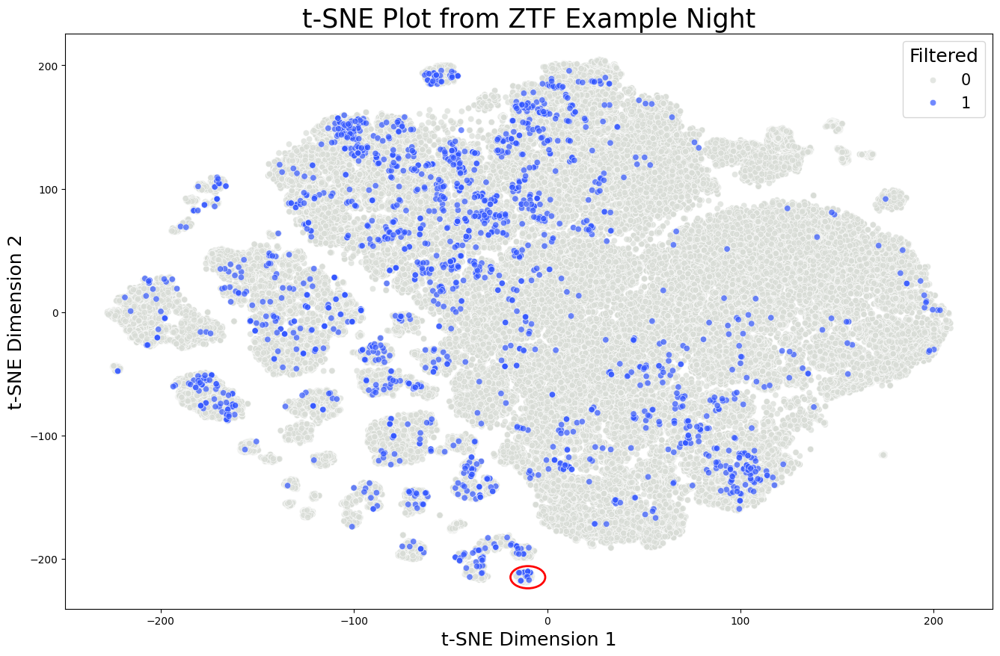

In [39]:
from plot_tsne import Tsne_subset
selector = Tsne_subset(df_plot)
center = (-10, -215)
radius = 9
selector.plot_selection(center,radius,filtered_only=False)

In [3]:
selected_alerts = selector.get_circled_alerts(center,radius)

Number of alerts selected: 395


In [55]:
selected_alerts

,objectId,fid,diffmaglim,isdiffpos,magpsf,sigmapsf,chipsf,magap,sigmagap,distnr,...,lastobs,galactic_latitude,filtered_bool,number_filtered,filter_classification,acai_classification,catnorth_classification,gaia_classification,tsne-2d-one,tsne-2d-two
10276,ZTF18acskhgx,1,19.405460,1,19.016661,0.179587,1.203104,18.892599,0.1978,2.662579,...,0.0,-11.219469,0,0,None,ambiguous,None,3.411542e+18,-14.208002,-218.529633
10954,ZTF24aahfwkw,1,19.236269,1,18.546797,0.110564,1.035757,18.531500,0.1429,19.449129,...,0.0,-30.668889,0,0,None,O,None,NaN,-8.370449,-216.003662
10977,ZTF24aahfvxc,1,19.212080,1,18.483414,0.127623,1.236846,18.453800,0.1356,14.647446,...,0.0,-28.816836,0,0,None,O,None,3.303608e+18,-8.391783,-215.811203
10983,ZTF24aahfvxz,1,19.178431,1,18.351994,0.125553,1.347983,18.391199,0.1307,5.942017,...,0.0,-25.597424,0,0,None,O,None,NaN,-8.308396,-215.909317
11083,ZTF24aahfwdo,1,19.303255,1,19.323215,0.208800,1.310543,19.629999,0.3816,11.449547,...,0.0,-28.551370,0,0,None,O,None,NaN,-11.317920,-218.736359
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199662,ZTF24aahirgs,3,19.762674,1,19.441835,0.166874,1.044213,19.468700,0.2960,8.492288,...,0.0,51.914014,0,0,None,O,None,NaN,-14.359330,-212.242569
199855,ZTF19abdspwg,3,19.902004,1,19.504286,0.169592,2.322109,19.368999,0.2458,8.793780,...,0.0,52.296329,0,0,None,O,None,NaN,-9.556736,-217.190186
202076,ZTF18acgvgiq,3,19.493565,0,19.629005,0.200199,0.971186,20.283199,0.7619,0.208451,...,0.0,50.217816,0,0,None,H,None,NaN,-15.964444,-214.362961
202317,ZTF24aahdimh,3,19.759027,1,19.528353,0.158081,1.086187,19.447599,0.2674,6.258956,...,0.0,66.381148,1,4,"SNe, GRB",O,None,1.229103e+18,-14.609328,-211.366791


174 / 395 alerts matched a SIMBAD classification


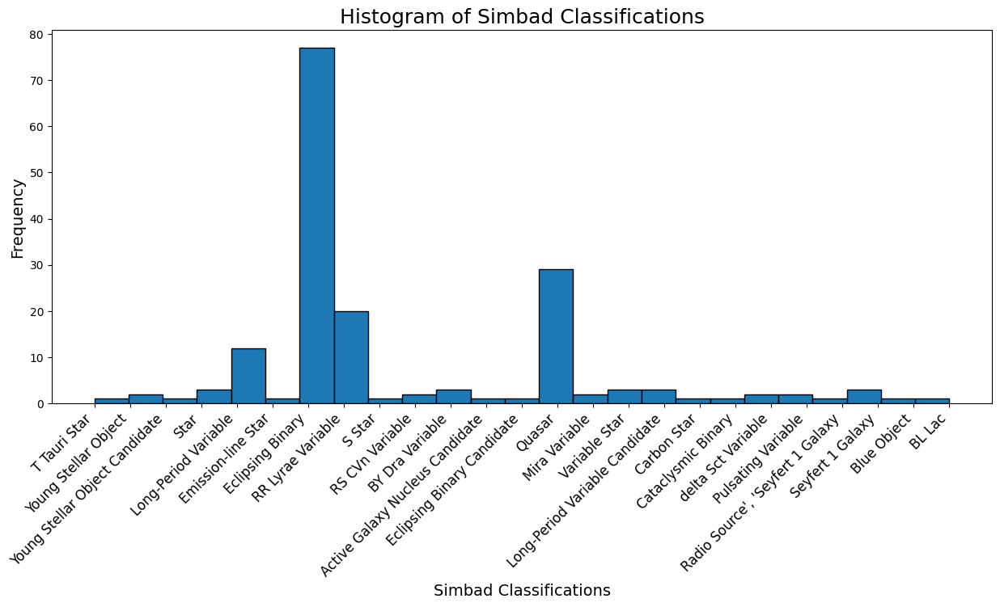

In [49]:
# get simbad classifications for all alerts in this subset (not just the filtered ones)
from alert_classifications import SimbadClassifications
simbad_data, selected_alerts = SimbadClassifications(selected_alerts, 
                                                     save_query_path=False, #otherwise input string
                                                     add_to_df=False, 
                                                     filtered_only=False,
                                                     verbose=False, 
                                                     display_results=True).get_classifications()